# Project 11 - Working with Geocoded Data

In [1]:
!pip install GDAL-3.1.4-cp38-cp38-win_amd64.whl 
!pip install Fiona-1.8.17-cp38-cp38-win_amd64.whl
!pip install Shapely-1.7.1-cp38-cp38-win_amd64.whl
!pip install geopandas

Processing c:\users\genesis paul\learn-python-for-stats-and-econ\gp in class projects\gdal-3.1.4-cp38-cp38-win_amd64.whl
GDAL is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.
Processing c:\users\genesis paul\learn-python-for-stats-and-econ\gp in class projects\fiona-1.8.17-cp38-cp38-win_amd64.whl
Fiona is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.
Processing c:\users\genesis paul\learn-python-for-stats-and-econ\gp in class projects\shapely-1.7.1-cp38-cp38-win_amd64.whl
Shapely is already installed with the same version as the provided wheel. Use --force-reinstall to force an installation of the wheel.


In [2]:
import pandas as pd
import numpy as np
import geopandas

import datetime #won't actually be used

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import cm

#for dynamic visualization:
from matplotlib.animation import FuncAnimation
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.ticker as mtick
import datadotworld as dw

In [3]:
def import_geo_data(filename, index_col = "Date", FIPS_name = "FIPS"):
    # import county level shapefile
    map_data = geopandas.read_file(filename = filename,
                                  index_col = index_col)
    # rename fips code to match variable name in COVID-19 data
    map_data.rename(columns={"State":"state"}, inplace = True)
    # Combine statefips and county fipsto create a single fips value
    # that indicates state and county
    map_data[FIPS_name] = map_data["STATEFP"].astype(str) +\
        map_data["COUNTYFP"].astype(str)
    map_data[FIPS_name] = map_data[FIPS_name].astype(np.int64)
    map_data.set_index(FIPS_name, inplace = True)
    
    return map_data

In [4]:
state_dict = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ',
    'Arkansas': 'AR', 'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 
    'Delaware': 'DE', 'District of Columbia': 'DC', 'Florida': 'FL', 
    'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL',
    'Indiana': 'IN', 'Iowa': 'IA','Kansas': 'KS', 'Kentucky': 'KY',
    'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD', 'Massachusetts': 'MA',
    'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS', 'Missouri': 'MO',
    'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI',
    'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX',
    'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA',
    'Washington': 'WA', 'West Virginia': 'WV', 'Wisconsin': 'WI', 
    'Wyoming': 'WY'}

plt.rcParams['axes.ymargin'] = 0
plt.rcParams['axes.xmargin'] = 0
plt.rcParams.update({'font.size': 26})

In [5]:
fips_name = "fips_code"
map_data = import_geo_data(
    filename = "countiesWithStatesAndPopulation.shp",
    index_col ="Date", FIPS_name = fips_name)
map_data

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,state,geometry
fips_code,,,,,,,,,,,
21007,21,007,00516850,0500000US21007,Ballard,06,639387454,69473325,7888.0,Kentucky,"POLYGON ((-89.18137 37.04630, -89.17938 37.053..."
21017,21,017,00516855,0500000US21017,Bourbon,06,750439351,4829777,19788.0,Kentucky,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
21031,21,031,00516862,0500000US21031,Butler,06,1103571974,13943044,12879.0,Kentucky,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
21065,21,065,00516879,0500000US21065,Estill,06,655509930,6516335,14106.0,Kentucky,"POLYGON ((-84.12662 37.64540, -84.12483 37.646..."
21069,21,069,00516881,0500000US21069,Fleming,06,902727151,7182793,14581.0,Kentucky,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."
...,...,...,...,...,...,...,...,...,...,...,...
31073,31,073,00835858,0500000US31073,Gosper,06,1186616237,11831826,1990.0,Nebraska,"POLYGON ((-100.09510 40.43866, -100.08937 40.4..."
39075,39,075,01074050,0500000US39075,Holmes,06,1094405866,3695230,43960.0,Ohio,"POLYGON ((-82.22066 40.66758, -82.19327 40.667..."
48171,48,171,01383871,0500000US48171,Gillespie,06,2740719114,9012764,26988.0,Texas,"POLYGON ((-99.30400 30.49983, -99.28234 30.499..."


Text(0.5, 1.0, 'California')

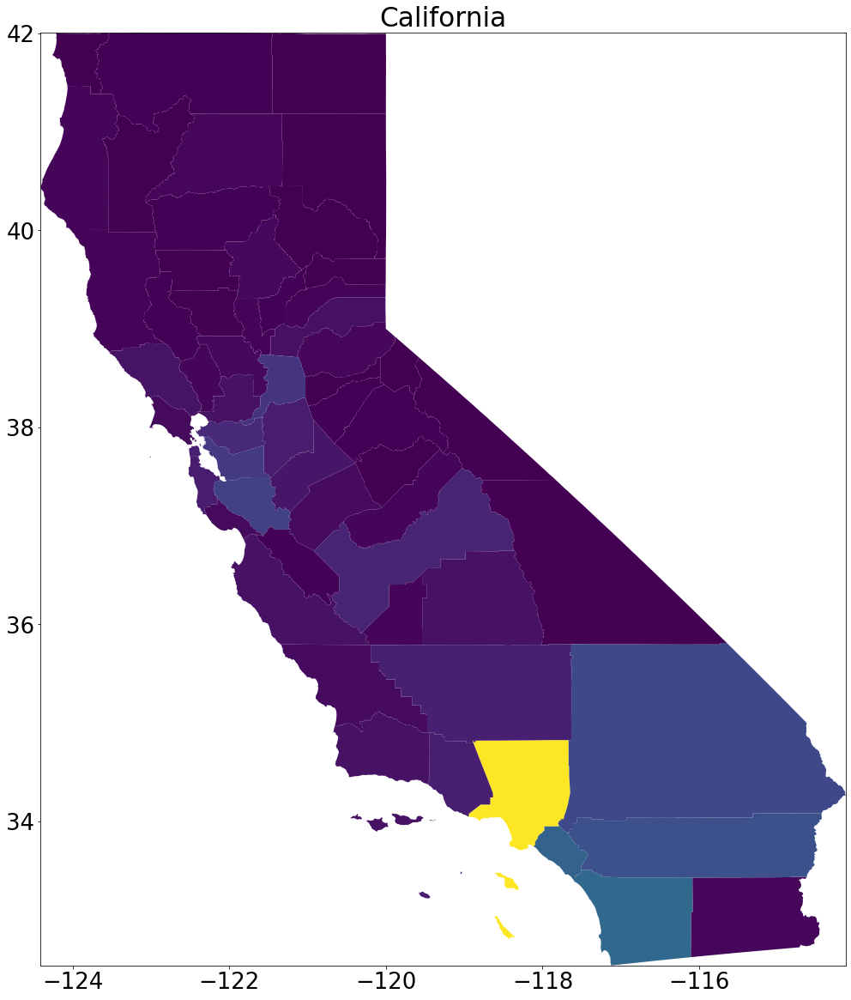

In [6]:
fig, ax = plt.subplots(figsize = (30,20))
map_data[map_data["state"] == "California"].plot(column = "Population", ax = ax)
ax.set_title("California")

Text(0.5, 1.0, 'North Dakota')

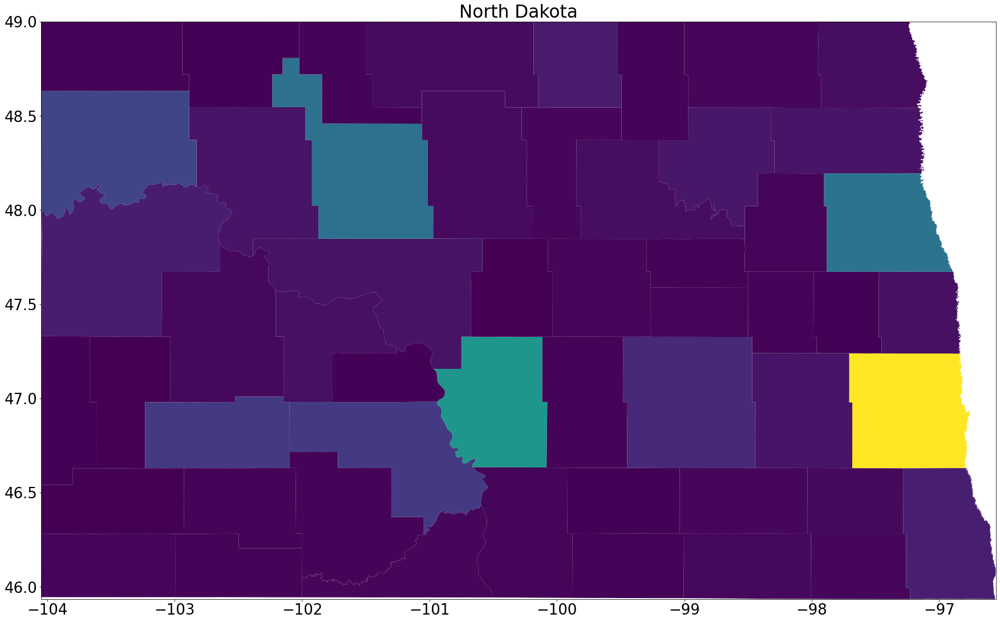

In [7]:
fig, ax = plt.subplots(figsize = (30,20))
map_data[map_data["state"] == "North Dakota"].plot(column = "Population", ax = ax)
ax.set_title("North Dakota")

In [8]:
def import_covid_data(FIPS_name):
    dataset = dw.load_dataset(
        "associatedpress/johns-hopkins-coronavirus-case-tracker",
        auto_update = True)
    covid_data = dataset.dataframes["2_cases_and_deaths_by_county_timeseries"]
    covid_data = covid_data[covid_data[FIPS_name] < 57000]
    covid_data = covid_data[covid_data[FIPS_name] > 0]
    
    covid_data[FIPS_name] = covid_data[FIPS_name].astype(np.int64)
    # format the date columns as datetime
    covid_data["date"] = pd.to_datetime(covid_data["date"])
    covid_data.set_index([FIPS_name, "date"], inplace = True)
    covid_data["state_abr"] = ""   
    for state, abr in state_dict.items():
        covid_data.loc[covid_data["state"] == state, "state_abr"] = abr
    covid_data["Location"] = covid_data["location_name"] + ", " + \
                                       covid_data["state_abr"]
    
    return covid_data

In [9]:
covid_data = import_covid_data(FIPS_name = fips_name)
covid_data

C:\Users\Genesis Paul\Learn-Python-for-Stats-and-Econ\GP In Class Projects\datadotworld\models\dataset.py:206: UserWarning: Unable to set data frame dtypes automatically using 2_cases_and_deaths_by_county_timeseries schema. Data types may need to be adjusted manually. Error: Integer column has NA values in column 2
  warnings.warn(


uid location_type location_name    state  \
fips_code date                                                        
1001      2020-01-22  84001001        county       Autauga  Alabama   
          2020-01-23  84001001        county       Autauga  Alabama   
          2020-01-24  84001001        county       Autauga  Alabama   
          2020-01-25  84001001        county       Autauga  Alabama   
          2020-01-26  84001001        county       Autauga  Alabama   
...                        ...           ...           ...      ...   
56045     2021-11-27  84056045        county        Weston  Wyoming   
          2021-11-28  84056045        county        Weston  Wyoming   
          2021-11-29  84056045        county        Weston  Wyoming   
          2021-11-30  84056045        county        Weston  Wyoming   
          2021-12-01  84056045        county        Weston  Wyoming   

                      total_population  cumulative_cases  \
fips_code date                                             
1001      2020-01-22           55200.0                 0   
          2020-01-23           55200.0                 0   
          2020-01-24           55200.0                 0   
          2020-01-25           55200.0                 0   
          2020-01-26           55200.0                 0   
...                                ...               ...   
56045     2021-11-27            7100.0              1189   
          2021-11-28            7100.0              1189   
          2021-11-29            7100.0              1193   
          2021-11-30            7100.0              1193   
          2021-12-01            7100.0              1193   

                      cumulative_cases_per_100_000  cumulative_deaths  \
fips_code date                                                          
1001      2020-01-22                          0.00                  0   
          2020-01-23                          0.00                  0   
          2020-01-24                          0.00                  0   
          2020-01-25                          0.00                  0   
          2020-01-26                          0.00                  0   
...                                            ...                ...   
56045     2021-11-27                      16746.48                 13   
          2021-11-28                      16746.48                 13   
          2021-11-29                      16802.82                 13   
          2021-11-30                      16802.82                 14   
          2021-12-01                      16802.82                 14   

                      cumulative_deaths_per_100_000  new_cases  new_deaths  \
fips_code date                                                               
1001      2020-01-22                           0.00        NaN         NaN   
          2020-01-23                           0.00        0.0         0.0   
          2020-01-24                           0.00        0.0         0.0   
          2020-01-25                           0.00        0.0         0.0   
          2020-01-26                           0.00        0.0         0.0   
...                                             ...        ...         ...   
56045     2021-11-27                         183.10        0.0         0.0   
          2021-11-28                         183.10        0.0         0.0   
          2021-11-29                         183.10        4.0         0.0   
          2021-11-30                         197.18        0.0         1.0   
          2021-12-01                         197.18        0.0         0.0   

                      new_cases_per_100_000  new_deaths_per_100_000  \
fips_code date                                                        
1001      2020-01-22                    NaN                     NaN   
          2020-01-23                   0.00                    0.00   
          2020-01-24                   0.00                    0.00   
  

In [10]:
covid_data[covid_data["state"] == "North Dakota"].groupby("date").sum()[["new_cases", "new_deaths"]]

,new_cases,new_deaths
date,,
2020-01-22,0.0,0.0
2020-01-23,0.0,0.0
2020-01-24,0.0,0.0
2020-01-25,0.0,0.0
2020-01-26,0.0,0.0
...,...,...
2021-11-27,369.0,2.0
2021-11-28,209.0,1.0
2021-11-29,151.0,0.0


Text(0.5, 1.0, 'United States')

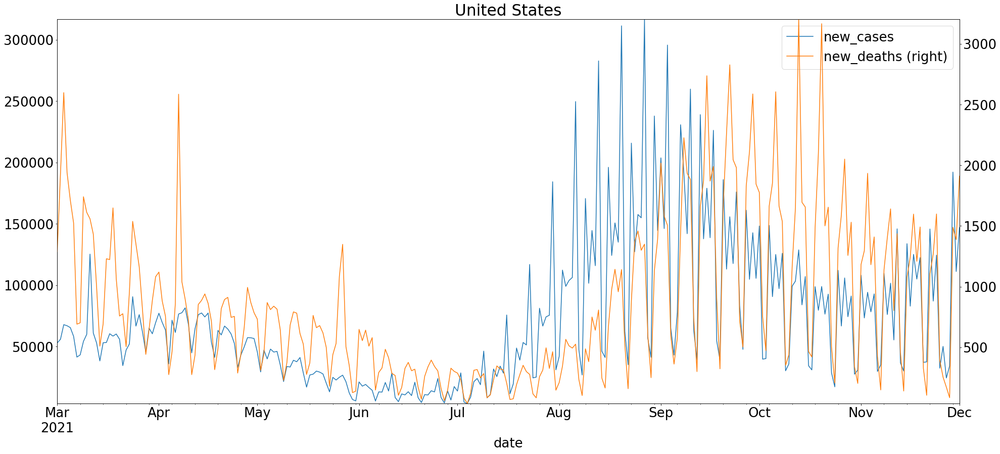

In [11]:
fig,ax = plt.subplots(figsize = (32,14))
covid_data.groupby("date").sum().loc["2021-03-01":,["new_cases", "new_deaths"]].plot.line(
    secondary_y = "new_deaths", ax = ax)
ax.set_title("United States")

Text(0.5, 1.0, 'United States')

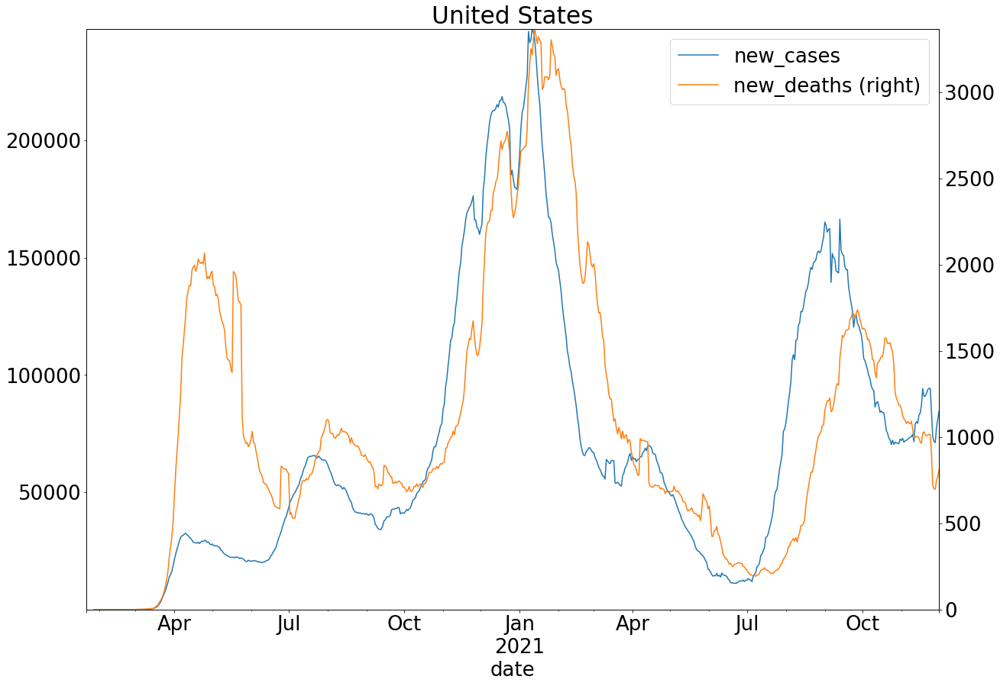

In [12]:
fig,ax = plt.subplots(figsize = (20,14))
covid_data.groupby("date").sum().loc[:,["new_cases", "new_deaths"]].rolling(7).mean().plot.line(
    secondary_y = "new_deaths", ax = ax)
ax.set_title("United States")

In [13]:
def create_merged_geo_dataframe(data, map_data, dates):
    data_frame_initialized = False
    
    counties = data.groupby("fips_code").mean().index
    for date in dates:
        agg_df = map_data[map_data.index.isin(counties)]
        agg_df["date"] = date
        if data_frame_initialized == False:
            matching_gpd = geopandas.GeoDataFrame(agg_df, 
                                                 crs = map_data.crs)
            data_frame_initialized = True
        else:
            matching_gpd = matching_gpd.append(
                agg_df,
                ignore_index = False)
    
    matching_gpd.reset_index(inplace = True)
    matching_gpd.set_index(["fips_code", "date"], inplace = True)
    matching_gpd.drop("state", axis = 1, inplace = True)
    
    matching_gpd = pd.concat([matching_gpd, data], axis = 1)
    
    return matching_gpd

In [14]:
dates = sorted(list(set(covid_data.index.get_level_values("date"))))
covid_data = create_merged_geo_dataframe(covid_data, map_data, dates)

In [15]:
covid_data

STATEFP COUNTYFP  COUNTYNS        AFFGEOID     NAME  \
fips_code date                                                              
1001      2020-01-22      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-23      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-24      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-25      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-26      1.0      001  00161526  0500000US01001  Autauga   
...                       ...      ...       ...             ...      ...   
56045     2021-11-27     56.0      045  01605086  0500000US56045   Weston   
          2021-11-28     56.0      045  01605086  0500000US56045   Weston   
          2021-11-29     56.0      045  01605086  0500000US56045   Weston   
          2021-11-30     56.0      045  01605086  0500000US56045   Weston   
          2021-12-01     56.0      045  01605086  0500000US56045   Weston   

                     LSAD         ALAND      AWATER  Population  \
fips_code date                                                    
1001      2020-01-22   06  1.539602e+09  25706961.0     55869.0   
          2020-01-23   06  1.539602e+09  25706961.0     55869.0   
          2020-01-24   06  1.539602e+09  25706961.0     55869.0   
          2020-01-25   06  1.539602e+09  25706961.0     55869.0   
          2020-01-26   06  1.539602e+09  25706961.0     55869.0   
...                   ...           ...         ...         ...   
56045     2021-11-27   06  6.210804e+09   5225499.0      6927.0   
          2021-11-28   06  6.210804e+09   5225499.0      6927.0   
          2021-11-29   06  6.210804e+09   5225499.0      6927.0   
          2021-11-30   06  6.210804e+09   5225499.0      6927.0   
          2021-12-01   06  6.210804e+09   5225499.0      6927.0   

                                                               geometry  ...  \
fips_code date                                                           ...   
1001      2020-01-22  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-23  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-24  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-25  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-26  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
...                                                                 ...  ...   
56045     2021-11-27  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-28  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-29  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-30  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-12-01  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   

                      cumulative_deaths cumulative_deaths_per_100_000  \
fips_code date                                                          
1001      2020-01-22                  0                          0.00   
          2020-01-23                  0                          0.00   
          2020-01-24                  0                          0.00   
          2020-01-25                  0                          0.00   
          2020-01-26                  0                          0.00   
...                                 ...                           ...   
56045     2021-11-27                 13                        183.10   
          2021-11-28                 13                        183.10   
          2021-11-29                 13                        183.10   
          2021-11-30                 14                        197.18   
          2021-12-01                 14                        197.18   

                     new_cases new_deaths  new_cases_per_100_000  \
fips_code date                                                     
1001      2020-01-22 

In [16]:
def create_new_vars(covid_data):
    for key in ["cases", "deaths"]:
        cap_key = key.title()
        covid_data.rename(columns = {"cumulative_" + key : "Total " + cap_key,
                                     "new_"+key: "Daily " + cap_key,
                                     "new_" + key + "_7_day_rolling_avg":"Daily " + cap_key + " 7 Day MA"},
                         inplace = True)

        covid_data[cap_key + " per Million"] = covid_data[
            "Total " + cap_key].fillna(0)\
            .div(covid_data["total_population"]).mul(10 ** 6)
        
        covid_data["Daily " + cap_key + " per Million 7 Day MA"] = \
            covid_data["Daily " + cap_key + " 7 Day MA"]\
            .div(covid_data["total_population"]).mul(10 ** 6)

create_new_vars(covid_data)
covid_data

STATEFP COUNTYFP  COUNTYNS        AFFGEOID     NAME  \
fips_code date                                                              
1001      2020-01-22      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-23      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-24      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-25      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-26      1.0      001  00161526  0500000US01001  Autauga   
...                       ...      ...       ...             ...      ...   
56045     2021-11-27     56.0      045  01605086  0500000US56045   Weston   
          2021-11-28     56.0      045  01605086  0500000US56045   Weston   
          2021-11-29     56.0      045  01605086  0500000US56045   Weston   
          2021-11-30     56.0      045  01605086  0500000US56045   Weston   
          2021-12-01     56.0      045  01605086  0500000US56045   Weston   

                     LSAD         ALAND      AWATER  Population  \
fips_code date                                                    
1001      2020-01-22   06  1.539602e+09  25706961.0     55869.0   
          2020-01-23   06  1.539602e+09  25706961.0     55869.0   
          2020-01-24   06  1.539602e+09  25706961.0     55869.0   
          2020-01-25   06  1.539602e+09  25706961.0     55869.0   
          2020-01-26   06  1.539602e+09  25706961.0     55869.0   
...                   ...           ...         ...         ...   
56045     2021-11-27   06  6.210804e+09   5225499.0      6927.0   
          2021-11-28   06  6.210804e+09   5225499.0      6927.0   
          2021-11-29   06  6.210804e+09   5225499.0      6927.0   
          2021-11-30   06  6.210804e+09   5225499.0      6927.0   
          2021-12-01   06  6.210804e+09   5225499.0      6927.0   

                                                               geometry  ...  \
fips_code date                                                           ...   
1001      2020-01-22  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-23  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-24  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-25  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-26  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
...                                                                 ...  ...   
56045     2021-11-27  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-28  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-29  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-30  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-12-01  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   

                      new_cases_per_100_000 new_deaths_per_100_000  \
fips_code date                                                       
1001      2020-01-22                    NaN                    NaN   
          2020-01-23                   0.00                   0.00   
          2020-01-24                   0.00                   0.00   
          2020-01-25                   0.00                   0.00   
          2020-01-26                   0.00                   0.00   
...                                     ...                    ...   
56045     2021-11-27                   0.00                   0.00   
          2021-11-28                   0.00                   0.00   
          2021-11-29                  56.34                   0.00   
          2021-11-30                   0.00                  14.08   
          2021-12-01                   0.00                   0.00   

                     Daily Cases 7 Day MA Daily Deaths 7 Day MA  state_abr  \
fips_code date                                                               
1001      2020-01-22                  Na

Text(0.5, 1.0, 'Daily Deaths per Million 7 Day MA')

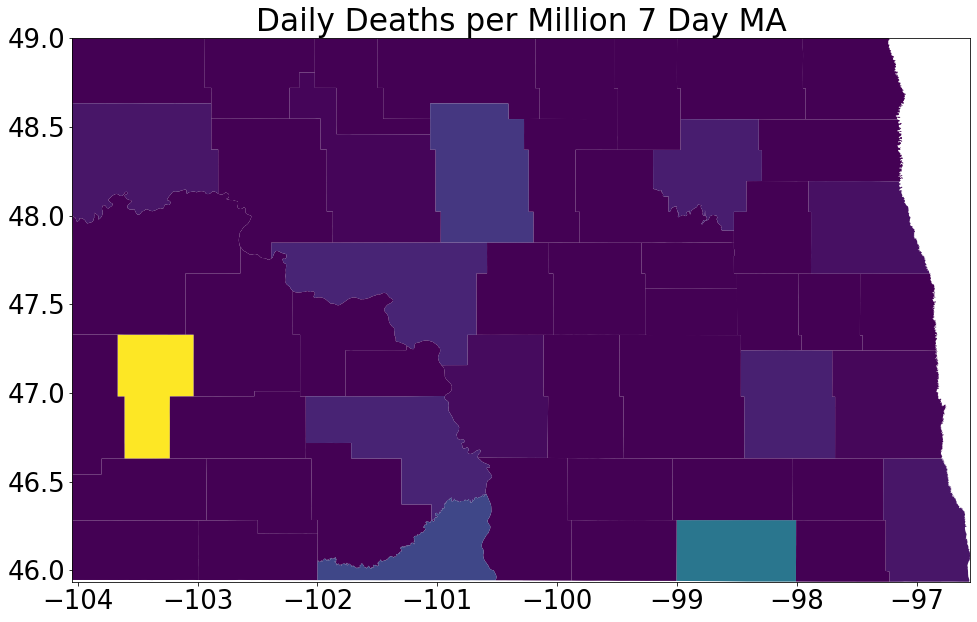

In [17]:
nd_data = covid_data[covid_data["state"] == "North Dakota"]

nd_data = nd_data[nd_data.index.get_level_values("date") == "2021-11-15"]

fig, ax = plt.subplots(figsize = (20,10))
key = "Daily Deaths per Million 7 Day MA"
nd_data.plot(column = key, ax = ax)#, cmap = "Reds")
ax.set_title(key)

In [18]:
start_date = "01-01-2021"     
end_date = dates[-1]

In [19]:
def select_data_within_bounds(data, minx, miny, maxx, maxy):
    data = data[data.bounds["maxx"] <= maxx]
    data = data[data.bounds["maxy"] <= maxy]
    data = data[data.bounds["minx"] >= minx]
    data = data[data.bounds["miny"] >= miny]
    
    return data


date = dates[-1]

if "map_bounded" not in locals():
    minx = covid_data[covid_data.index.get_level_values("date")== date].bounds["minx"].min()
    miny = covid_data[covid_data.index.get_level_values("date")== date].bounds["miny"].min()
    maxx = -58
    maxy = covid_data[covid_data.index.get_level_values("date")== date].bounds["maxy"].max()

    bounded_data =  select_data_within_bounds(covid_data[covid_data.index.get_level_values("date")== date], minx, miny, maxx, maxy)
    counties = bounded_data.groupby("fips_code").mean().index
    covid_map_data =covid_data[covid_data.index.get_level_values("fips_code").isin(counties)]
    map_bounded = True  
    
covid_map_data

STATEFP COUNTYFP  COUNTYNS        AFFGEOID     NAME  \
fips_code date                                                              
1001      2020-01-22      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-23      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-24      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-25      1.0      001  00161526  0500000US01001  Autauga   
          2020-01-26      1.0      001  00161526  0500000US01001  Autauga   
...                       ...      ...       ...             ...      ...   
56045     2021-11-27     56.0      045  01605086  0500000US56045   Weston   
          2021-11-28     56.0      045  01605086  0500000US56045   Weston   
          2021-11-29     56.0      045  01605086  0500000US56045   Weston   
          2021-11-30     56.0      045  01605086  0500000US56045   Weston   
          2021-12-01     56.0      045  01605086  0500000US56045   Weston   

                     LSAD         ALAND      AWATER  Population  \
fips_code date                                                    
1001      2020-01-22   06  1.539602e+09  25706961.0     55869.0   
          2020-01-23   06  1.539602e+09  25706961.0     55869.0   
          2020-01-24   06  1.539602e+09  25706961.0     55869.0   
          2020-01-25   06  1.539602e+09  25706961.0     55869.0   
          2020-01-26   06  1.539602e+09  25706961.0     55869.0   
...                   ...           ...         ...         ...   
56045     2021-11-27   06  6.210804e+09   5225499.0      6927.0   
          2021-11-28   06  6.210804e+09   5225499.0      6927.0   
          2021-11-29   06  6.210804e+09   5225499.0      6927.0   
          2021-11-30   06  6.210804e+09   5225499.0      6927.0   
          2021-12-01   06  6.210804e+09   5225499.0      6927.0   

                                                               geometry  ...  \
fips_code date                                                           ...   
1001      2020-01-22  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-23  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-24  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-25  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2020-01-26  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
...                                                                 ...  ...   
56045     2021-11-27  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-28  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-29  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-11-30  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   
          2021-12-01  POLYGON ((-105.08078 43.96622, -105.07928 44.1...  ...   

                      new_cases_per_100_000 new_deaths_per_100_000  \
fips_code date                                                       
1001      2020-01-22                    NaN                    NaN   
          2020-01-23                   0.00                   0.00   
          2020-01-24                   0.00                   0.00   
          2020-01-25                   0.00                   0.00   
          2020-01-26                   0.00                   0.00   
...                                     ...                    ...   
56045     2021-11-27                   0.00                   0.00   
          2021-11-28                   0.00                   0.00   
          2021-11-29                  56.34                   0.00   
          2021-11-30                   0.00                  14.08   
          2021-12-01                   0.00                   0.00   

                     Daily Cases 7 Day MA Daily Deaths 7 Day MA  state_abr  \
fips_code date                                                               
1001      2020-01-22                  Na

In [20]:
covid_map_data.fillna(0, inplace = True)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4462: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


Text(0.5, 1.0, '2021-12-01\nDeaths per Million')

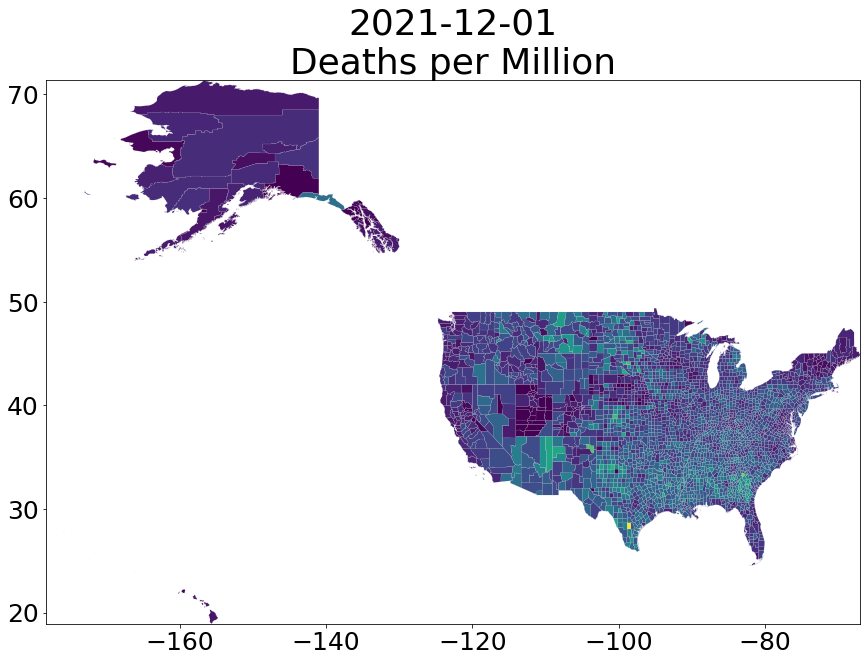

In [21]:
fig, ax = plt.subplots(figsize = (20,10))
plt.rcParams.update({"font.size": 30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
df = covid_map_data[covid_map_data.index.get_level_values("date")==date]
df.plot(ax = ax, column = key, linewidth = .1,
       edgecolor = "lightgrey")
ax.set_title(str(date)[:10]+ "\n" + key)

### Add Hawaii & Alaska in Subwindow

<ipython-input-22-1298100edf0e>:1: MatplotlibDeprecationWarning: 
The mpl_toolkits.axes_grid module was deprecated in Matplotlib 2.1 and will be removed two minor releases later. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist, which provide the same functionality instead.
  from mpl_toolkits.axes_grid.inset_locator import inset_axes
<ipython-input-22-1298100edf0e>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax = cax, cmap = cmap)
<ipython-input-22-1298100edf0e>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels([int(x) for x in vals])


(53.0, 74.0)

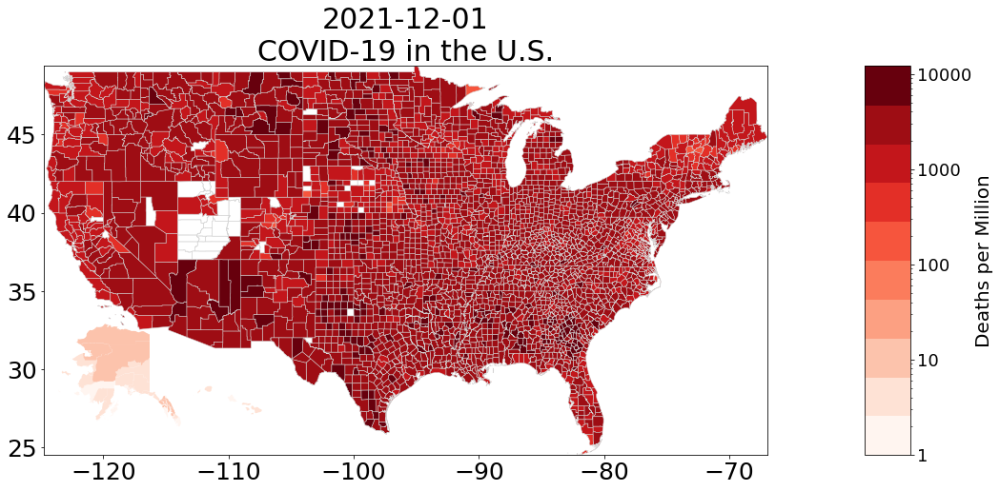

In [22]:
from mpl_toolkits.axes_grid.inset_locator import inset_axes

fig, ax = plt.subplots(figsize = (18,8),
                      subplot_kw = {"aspect": "equal"})
plt.rcParams.update({"font.size":30})
plt.xticks(fontsize = 25)
plt.yticks(fontsize = 25)
key = "Deaths per Million"
map_data = covid_map_data[
    covid_map_data.index.get_level_values("date") == date]
df = map_data[~map_data["state"].str.contains("Alaska|Hawaii")]

cmap = cm.get_cmap("Reds",10)
vmin = 1
vmax = df[key].max()
norm = cm.colors.LogNorm(vmin=vmin, vmax=vmax)
sm = cm.ScalarMappable(cmap = cmap, norm = norm)

sm._A = []
divider = make_axes_locatable(ax)
size = "5%"
cax = divider.append_axes("right", size = size, pad = 0.1)

cbar = fig.colorbar(sm, cax = cax, cmap = cmap)
cbar.ax.tick_params(labelsize = 18)
vals = list(cbar.ax.get_yticks())
vals.append(vmax)
cbar.ax.set_yticklabels([int(x) for x in vals])
cbar.ax.set_ylabel(key, fontsize=20)

df.plot(ax = ax, column=key, vmin = vmin, vmax = vmax,
       cmap = cmap, legend = False, linewidth = .5, edgecolor = "lightgrey",
       norm = norm)

ax.set_title(str(date)[:10] +"\nCOVID-19 in the U.S.",
            fontsize = 30)

axins = {}
axins["Alaska"] = inset_axes(ax, width ="17%", height = "35%",
                            loc = "lower left")
axins["Hawaii"] = inset_axes(ax, width ="50%", height = "40%",
                            loc = "lower left")

for state in axins.keys():
    axins[state].set_xticks([])
    axins[state].set_yticks([])
    axins[state].axis("off")
    map_data[map_data["state"].str.contains(state)].plot(
        ax = axins[state], cax = ax, cmap = cmap, norm = norm)
    
axins["Hawaii"].set_xlim(-161, -154)
axins["Alaska"].set_ylim(53, 74)

<ipython-input-23-170737371b56>:23: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax = cax, cmap = cmap)
<ipython-input-23-170737371b56>:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels([int(x) for x in vals])
<ipython-input-23-170737371b56>:23: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax = cax, cmap = cmap)
<ipython-input-23-170737371b56>:27: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels([int(x) for x in vals])
<ipython-input-23-170737371b56>:23: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because i

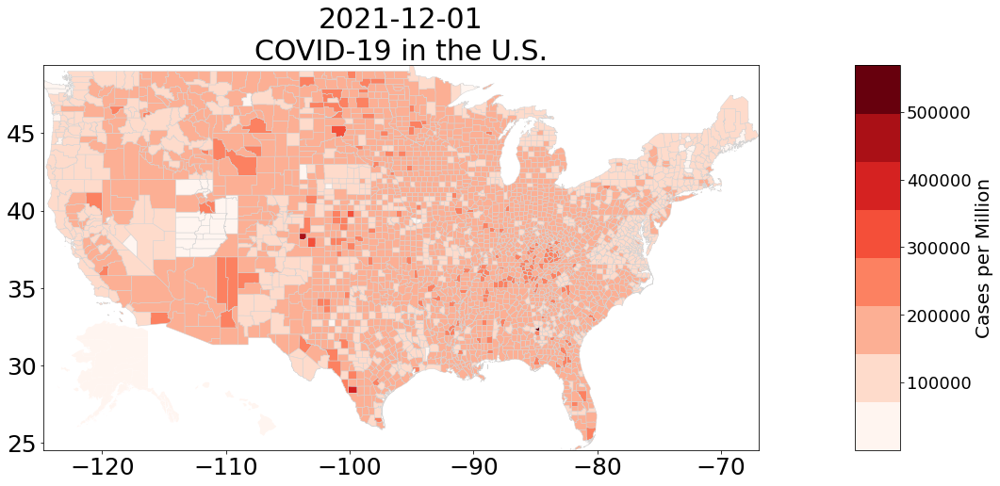

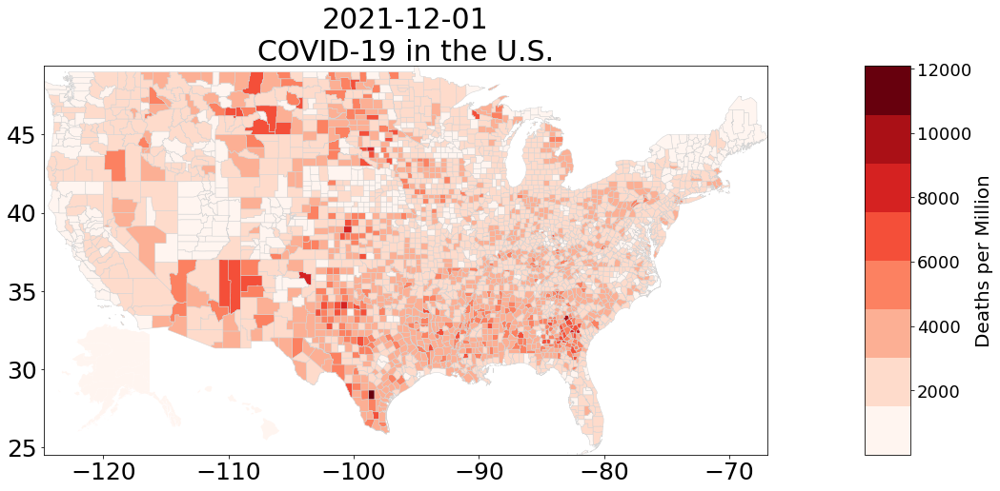

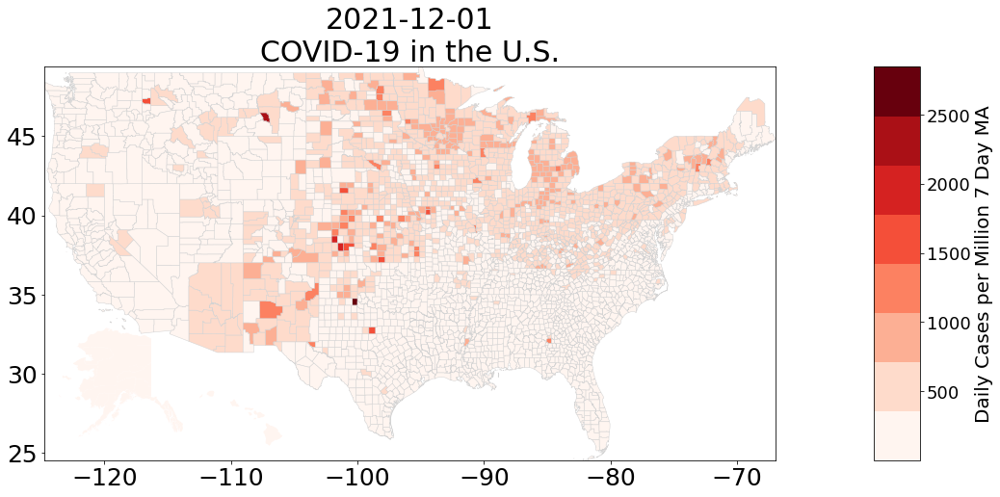

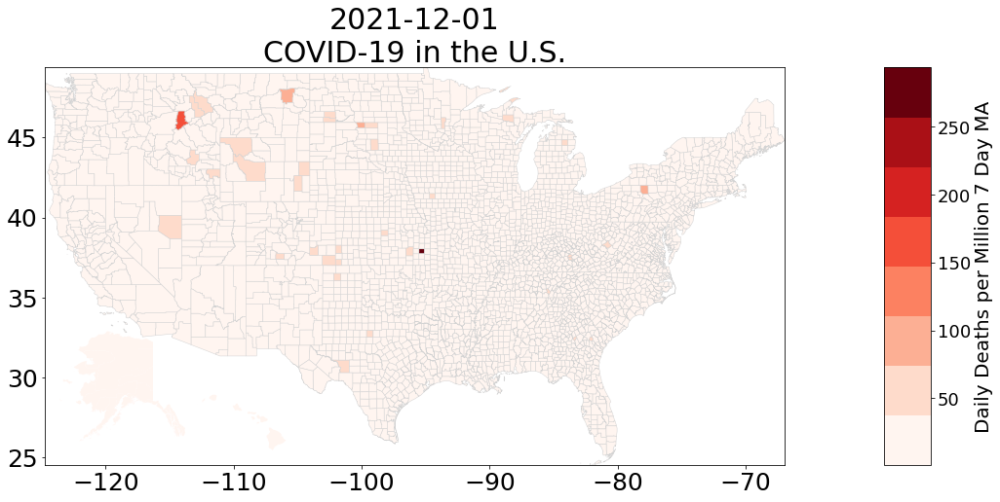

In [23]:
keys = ["Cases per Million", "Deaths per Million", 
        "Daily Cases per Million 7 Day MA", "Daily Deaths per Million 7 Day MA"]
for key in keys:
    fig, ax = plt.subplots(figsize = (18,8),
                          subplot_kw = {"aspect": "equal"})
    plt.rcParams.update({"font.size":30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    map_data = covid_map_data[
        covid_map_data.index.get_level_values("date") == date]
    df = map_data[~map_data["state"].str.contains("Alaska|Hawaii")]

    cmap = cm.get_cmap("Reds",8)
    vmin = 1
    vmax = df[key].max()
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)
    sm = cm.ScalarMappable(cmap = cmap, norm = norm)

    sm._A = []
    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = 0.1)
    cbar = fig.colorbar(sm, cax = cax, cmap = cmap)
    cbar.ax.tick_params(labelsize = 18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels([int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize=20)

    df.plot(ax = ax, column=key, vmin = vmin, vmax = vmax,
           cmap = cmap, legend = False, linewidth = .5, edgecolor = "lightgrey",
           norm = norm)

    ax.set_title(str(date)[:10] +"\nCOVID-19 in the U.S.",
                fontsize = 30)

    axins = {}
    axins["Alaska"] = inset_axes(ax, width ="17%", height = "35%",
                                loc = "lower left")
    axins["Hawaii"] = inset_axes(ax, width ="50%", height = "40%",
                                loc = "lower left")

    for state in axins.keys():
        axins[state].set_xticks([])
        axins[state].set_yticks([])
        axins[state].axis("off")
        map_data[map_data["state"].str.contains(state)].plot(
            ax = axins[state], cax = ax, cmap = cmap, norm = norm)

    axins["Hawaii"].set_xlim(-161, -154)
    axins["Alaska"].set_ylim(53, 74)
    

### Covid & Unemployment

In [24]:
import pandas as pd

In [25]:
u_data = pd.read_csv(
    "countyUnemploymentData.csv", encoding = "latin1", parse_dates = True, index_col="date")

u_data.reset_index(inplace = True)
index = u_data["fips_code"].dropna(axis = 0).index
u_data = u_data.loc[index]

u_data["fips_code"] = u_data["fips_code"].astype(int)
u_data.set_index(["fips_code", "date"], inplace = True)

u_data

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,,state_fips,county_fips,Location,Labor Force,Employed,Unemployed,Unemployment Rate
fips_code,date,,,,,,,
1001,2019-08-01,1,1,Autauga County AL,"26,079","25,368",711,2.7
1003,2019-08-01,1,3,Baldwin County AL,"97,939","95,367","2,572",2.6
1005,2019-08-01,1,5,Barbour County AL,"8,652","8,322",330,3.8
1007,2019-08-01,1,7,Bibb County AL,"8,670","8,403",267,3.1
1009,2019-08-01,1,9,Blount County AL,"25,309","24,641",668,2.6
...,...,...,...,...,...,...,...,...
72145,2021-06-01,72,145,Vega Baja Municipio PR,"12,993","11,580","1,413",10.9
72147,2021-06-01,72,147,Vieques Municipio PR,"2,610","2,288",322,12.3
72149,2021-06-01,72,149,Villalba Municipio PR,"6,940","6,152",788,11.4


In [26]:
map_data = map_data.reset_index().set_index("fips_code")
#map_data.drop("geometry", axis = 1, inplace = True)
map_data

,date,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,Population,...,new_cases_per_100_000,new_deaths_per_100_000,Daily Cases 7 Day MA,Daily Deaths 7 Day MA,state_abr,Location,Cases per Million,Daily Cases per Million 7 Day MA,Deaths per Million,Daily Deaths per Million 7 Day MA
fips_code,,,,,,,,,,,,,,,,,,,,,
1001,2021-12-01,1.0,001,00161526,0500000US01001,Autauga,06,1.539602e+09,2.570696e+07,55869.0,...,1.81,0.00,2.71,0.14,AL,"Autauga, AL",190706.521739,49.094203,2844.202899,2.536232
1003,2021-12-01,1.0,003,00161527,0500000US01003,Baldwin,06,4.117547e+09,1.133056e+09,223234.0,...,9.13,0.00,11.57,0.00,AL,"Baldwin, AL",183189.416983,55.596400,2830.274811,0.000000
1005,2021-12-01,1.0,005,00161528,0500000US01005,Barbour,06,2.292145e+09,5.053870e+07,24686.0,...,3.88,0.00,1.29,0.00,AL,"Barbour, AL",143510.976650,50.034908,3102.940036,0.000000
1007,2021-12-01,1.0,007,00161529,0500000US01007,Bibb,06,1.612167e+09,9.602089e+06,22394.0,...,13.32,0.00,1.29,0.00,AL,"Bibb, AL",193012.829050,57.264616,4172.770453,0.000000
1009,2021-12-01,1.0,009,00161530,0500000US01009,Blount,06,1.670104e+09,1.501542e+07,57826.0,...,17.35,1.73,6.14,0.14,AL,"Blount, AL",186295.428918,106.514008,3348.078758,2.428658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,2021-12-01,56.0,037,01609192,0500000US56037,Sweetwater,06,2.700575e+10,1.662303e+08,42343.0,...,13.60,0.00,8.43,0.57,WY,"Sweetwater, WY",184124.033819,191.082803,2289.366911,12.920189
56039,2021-12-01,56.0,039,01605083,0500000US56039,Teton,06,1.035178e+10,5.708649e+08,23464.0,...,4.34,0.00,3.57,0.00,WY,"Teton, WY",233791.578126,154.820244,607.138211,0.000000
56041,2021-12-01,56.0,041,01605084,0500000US56041,Uinta,06,5.391632e+09,1.662582e+07,20226.0,...,38.82,0.00,4.43,0.14,WY,"Uinta, WY",196758.697656,214.954631,1504.197195,6.793149


In [27]:
dates = u_data.groupby("date").mean().index
sorted(dates)

[Timestamp('2019-08-01 00:00:00'),
 Timestamp('2019-09-01 00:00:00'),
 Timestamp('2019-10-01 00:00:00'),
 Timestamp('2019-11-01 00:00:00'),
 Timestamp('2019-12-01 00:00:00'),
 Timestamp('2020-01-01 00:00:00'),
 Timestamp('2020-02-01 00:00:00'),
 Timestamp('2020-03-01 00:00:00'),
 Timestamp('2020-04-01 00:00:00'),
 Timestamp('2020-05-01 00:00:00'),
 Timestamp('2020-06-01 00:00:00'),
 Timestamp('2020-07-01 00:00:00'),
 Timestamp('2020-08-01 00:00:00'),
 Timestamp('2020-09-01 00:00:00'),
 Timestamp('2020-10-01 00:00:00'),
 Timestamp('2020-11-01 00:00:00'),
 Timestamp('2020-12-01 00:00:00'),
 Timestamp('2021-01-01 00:00:00'),
 Timestamp('2021-02-01 00:00:00'),
 Timestamp('2021-03-01 00:00:00'),
 Timestamp('2021-04-01 00:00:00'),
 Timestamp('2021-05-01 00:00:00'),
 Timestamp('2021-06-01 00:00:00')]

In [28]:
u_data = create_merged_geo_dataframe(u_data, map_data, dates)
u_data

C:\ProgramData\Anaconda3\lib\site-packages\geopandas\geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


STATEFP COUNTYFP  COUNTYNS        AFFGEOID     NAME  \
fips_code date                                                              
1001      2019-08-01      1.0      001  00161526  0500000US01001  Autauga   
          2019-09-01      1.0      001  00161526  0500000US01001  Autauga   
          2019-10-01      1.0      001  00161526  0500000US01001  Autauga   
          2019-11-01      1.0      001  00161526  0500000US01001  Autauga   
          2019-12-01      1.0      001  00161526  0500000US01001  Autauga   
...                       ...      ...       ...             ...      ...   
72153     2021-02-01      NaN      NaN       NaN             NaN      NaN   
          2021-03-01      NaN      NaN       NaN             NaN      NaN   
          2021-04-01      NaN      NaN       NaN             NaN      NaN   
          2021-05-01      NaN      NaN       NaN             NaN      NaN   
          2021-06-01      NaN      NaN       NaN             NaN      NaN   

                     LSAD         ALAND      AWATER  Population  \
fips_code date                                                    
1001      2019-08-01   06  1.539602e+09  25706961.0     55869.0   
          2019-09-01   06  1.539602e+09  25706961.0     55869.0   
          2019-10-01   06  1.539602e+09  25706961.0     55869.0   
          2019-11-01   06  1.539602e+09  25706961.0     55869.0   
          2019-12-01   06  1.539602e+09  25706961.0     55869.0   
...                   ...           ...         ...         ...   
72153     2021-02-01  NaN           NaN         NaN         NaN   
          2021-03-01  NaN           NaN         NaN         NaN   
          2021-04-01  NaN           NaN         NaN         NaN   
          2021-05-01  NaN           NaN         NaN         NaN   
          2021-06-01  NaN           NaN         NaN         NaN   

                                                               geometry  ...  \
fips_code date                                                           ...   
1001      2019-08-01  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2019-09-01  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2019-10-01  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2019-11-01  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
          2019-12-01  POLYGON ((-86.92120 32.65754, -86.92035 32.658...  ...   
...                                                                 ...  ...   
72153     2021-02-01                                               None  ...   
          2021-03-01                                               None  ...   
          2021-04-01                                               None  ...   
          2021-05-01                                               None  ...   
          2021-06-01                                               None  ...   

                      Daily Cases per Million 7 Day MA Deaths per Million  \
fips_code date                                                              
1001      2019-08-01                         49.094203        2844.202899   
          2019-09-01                         49.094203        2844.202899   
          2019-10-01                         49.094203        2844.202899   
          2019-11-01                         49.094203        2844.202899   
          2019-12-01                         49.094203        2844.202899   
...                                                ...                ...   
72153     2021-02-01                               NaN                NaN   
          2021-03-01                               NaN                NaN   
          2021-04-01                               NaN                NaN   
          2021-05-01                               NaN                NaN   
          2021-06-01                               NaN                NaN   

                     Daily Deaths per Million 7 Day MA  state_fips  \
fips_code date                     

In [29]:
minx = -127
miny = 23
maxx = -66
maxy = 50

u_data = select_data_within_bounds(u_data, 
                                   minx, 
                                   miny, 
                                   maxx,
                                   maxy)

In [30]:
counties = u_data.groupby("fips_code").mean().index

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


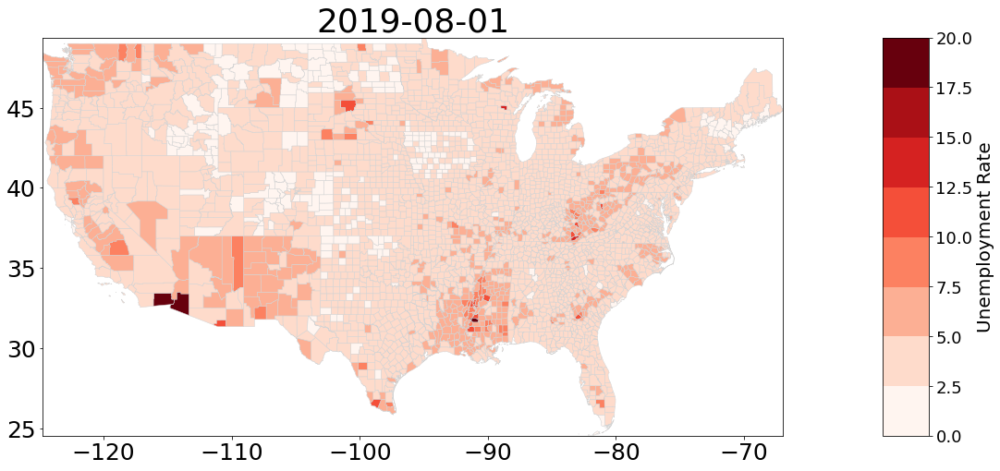

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


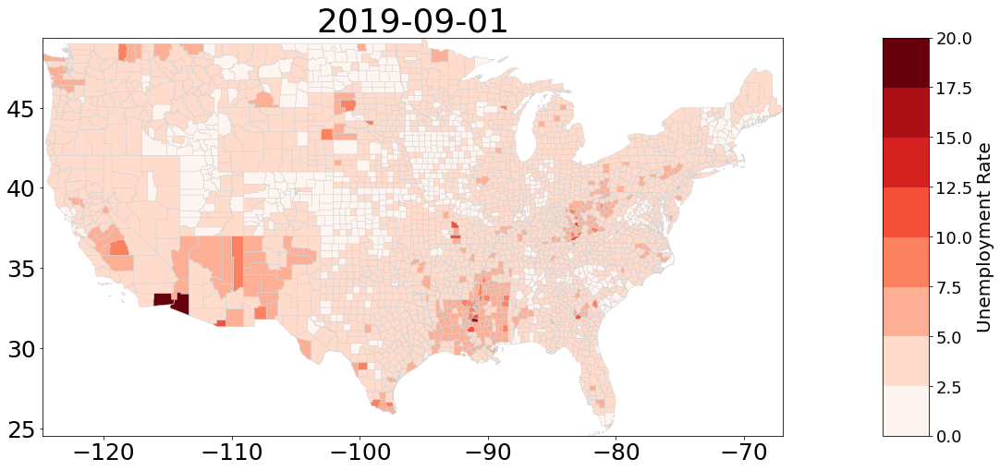

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


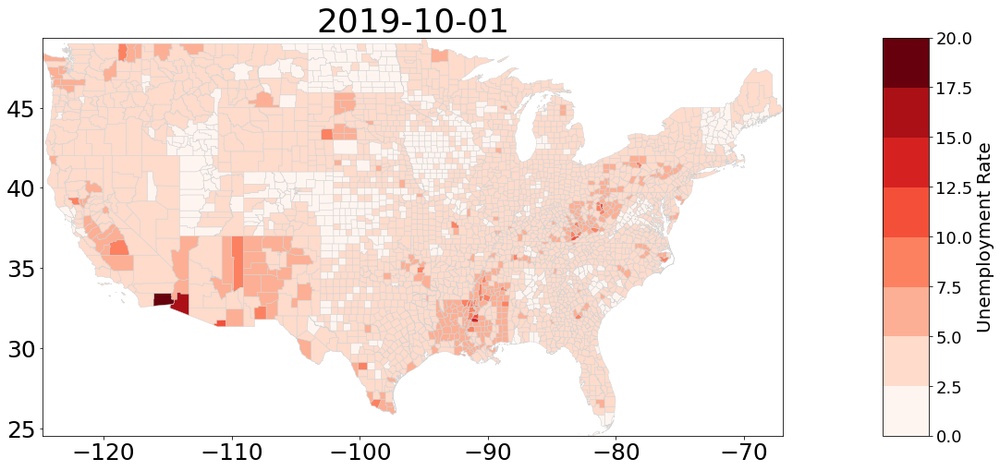

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


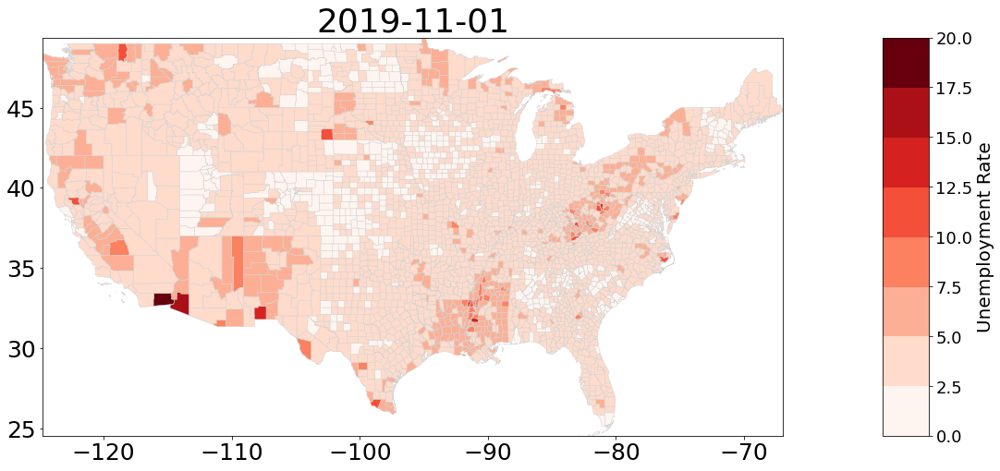

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


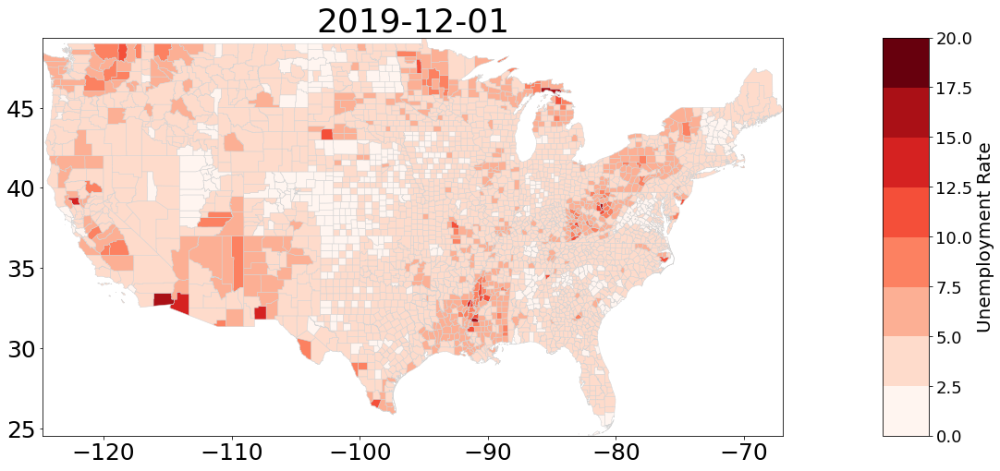

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


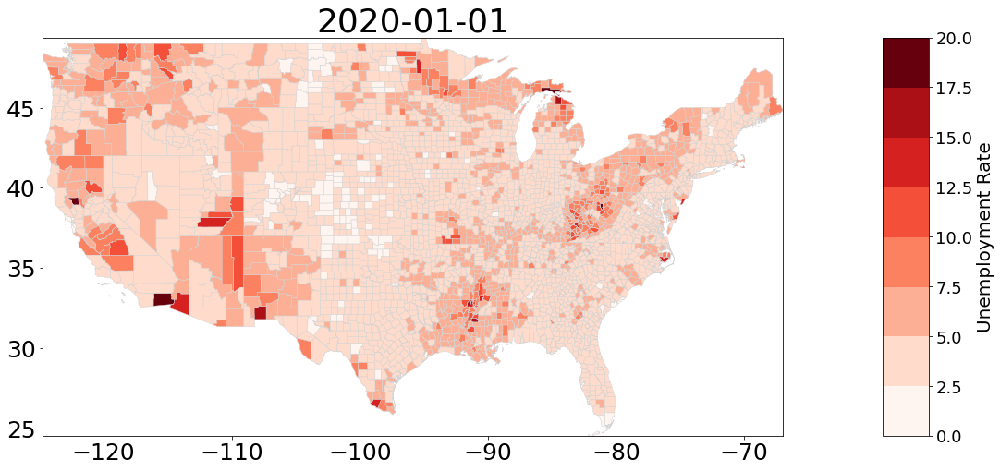

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


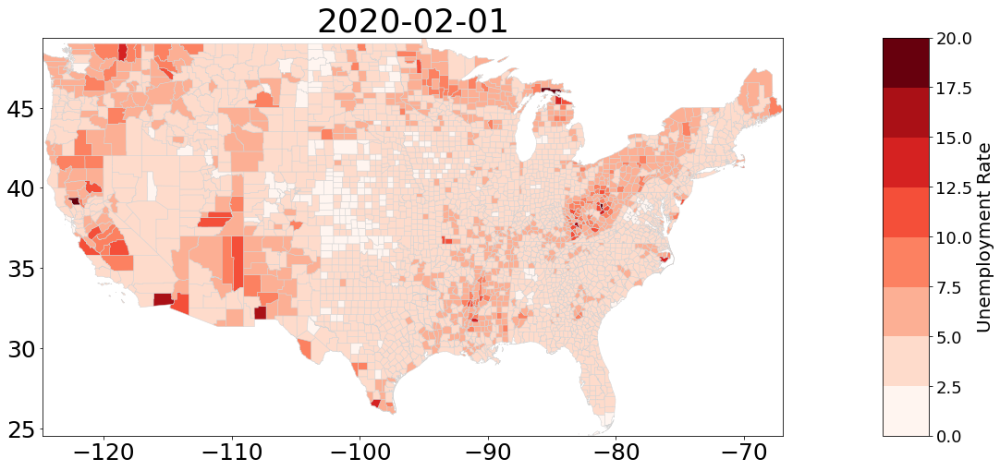

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


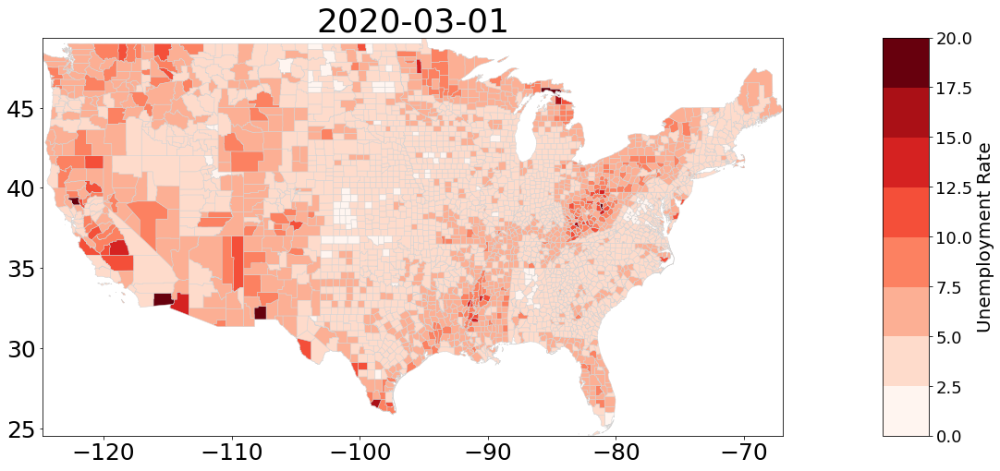

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


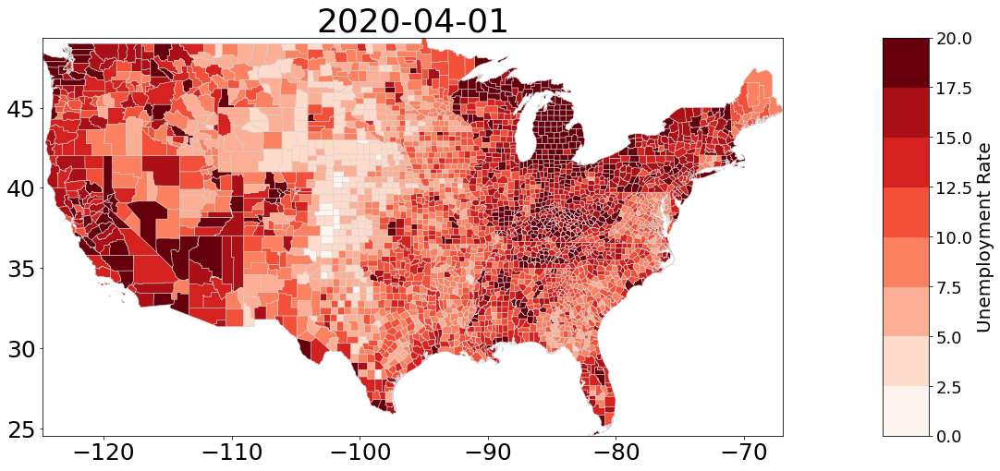

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


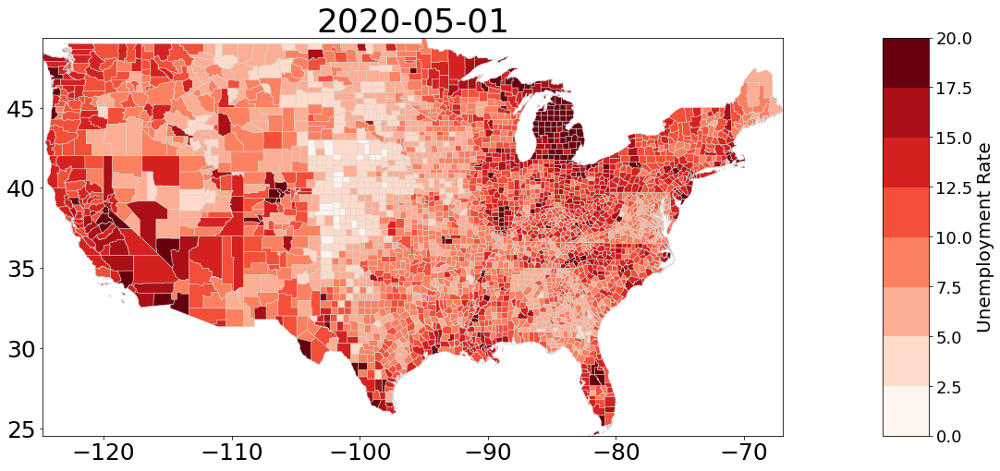

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


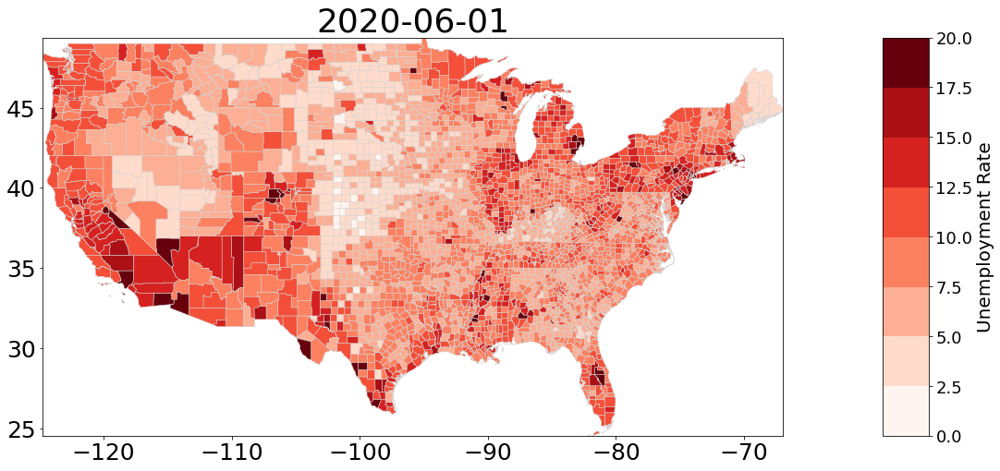

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


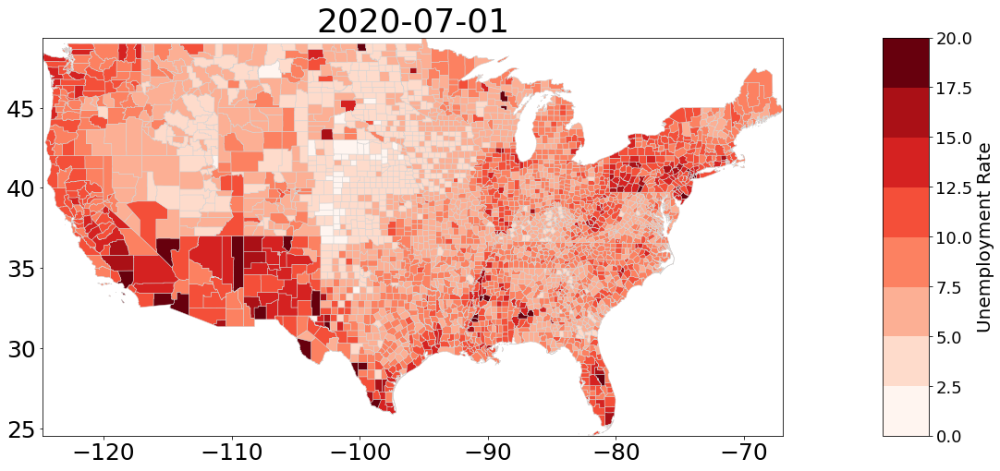

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


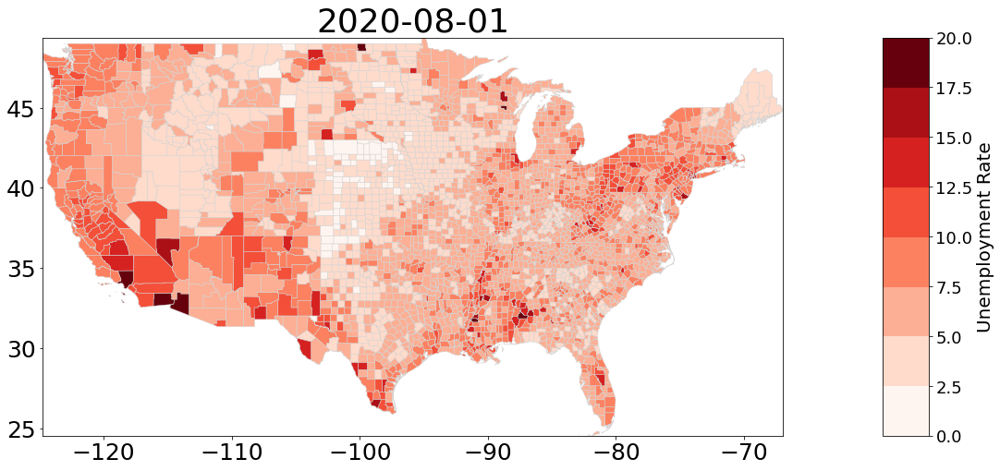

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


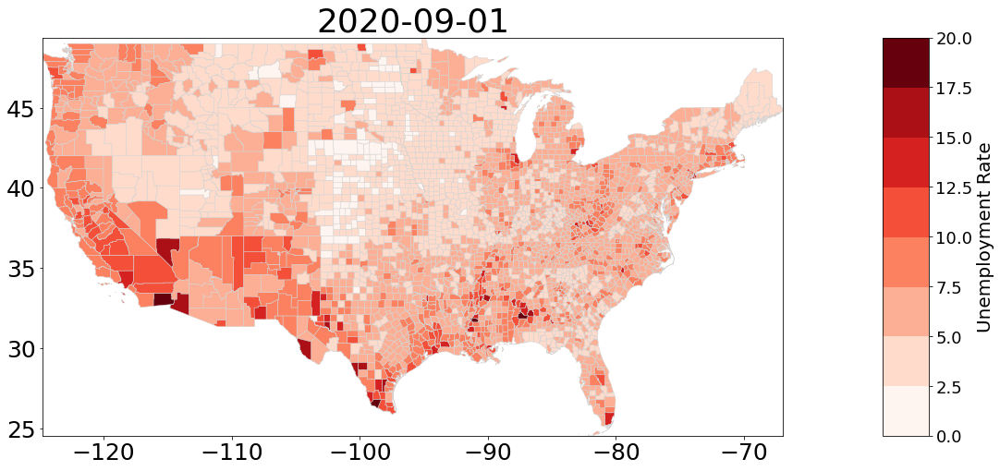

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


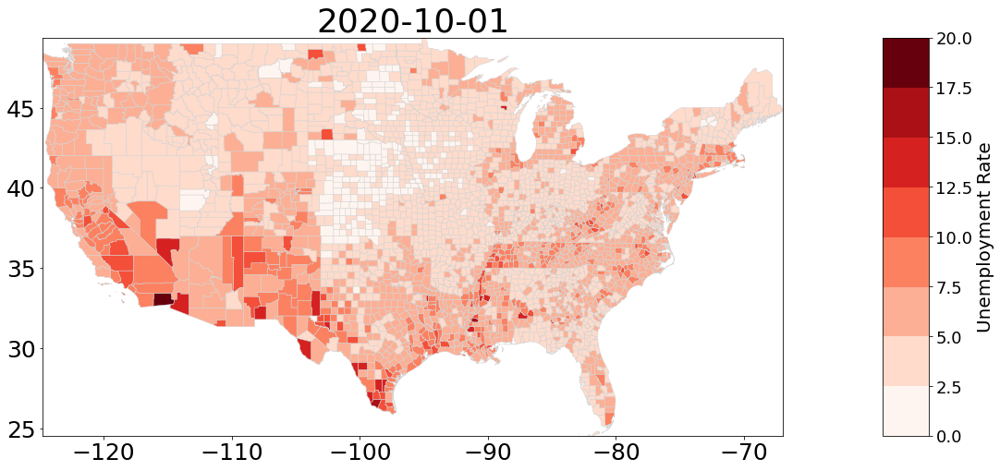

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


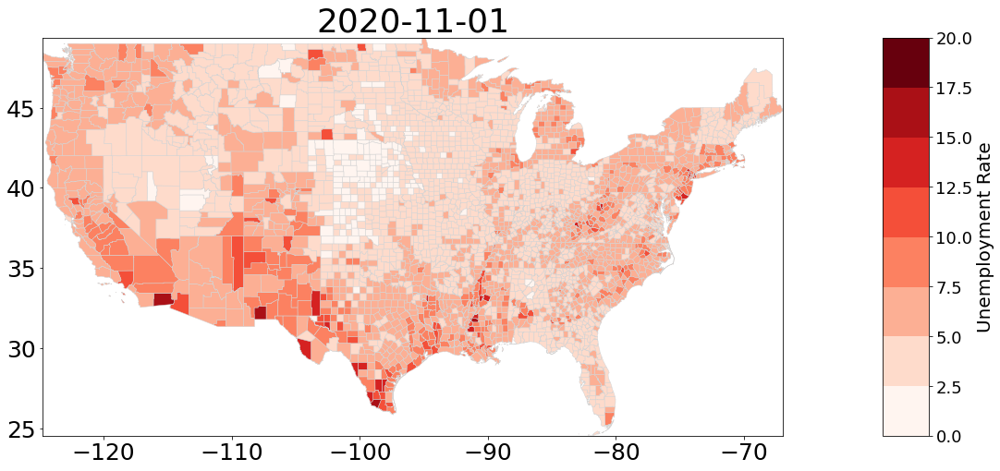

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


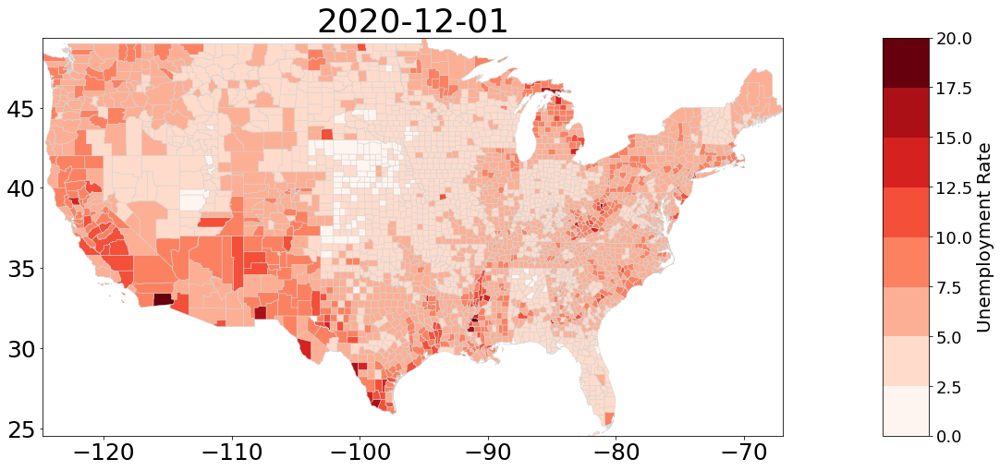

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


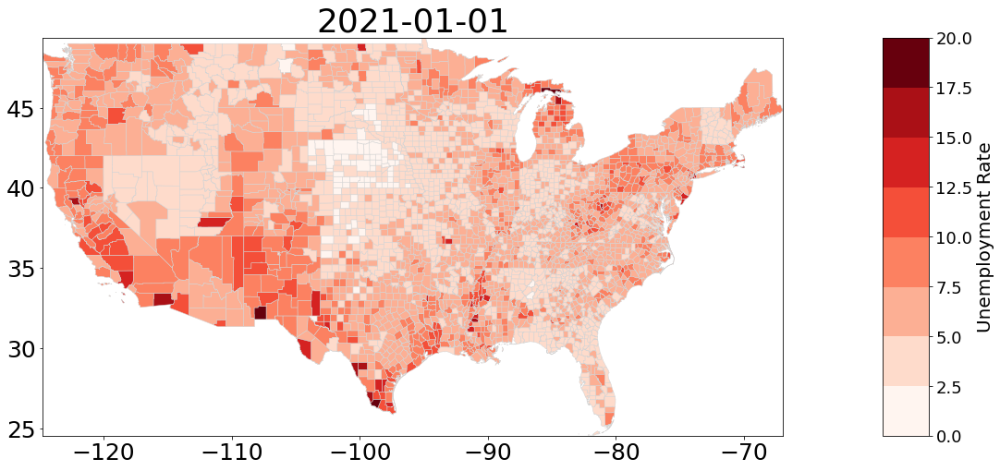

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


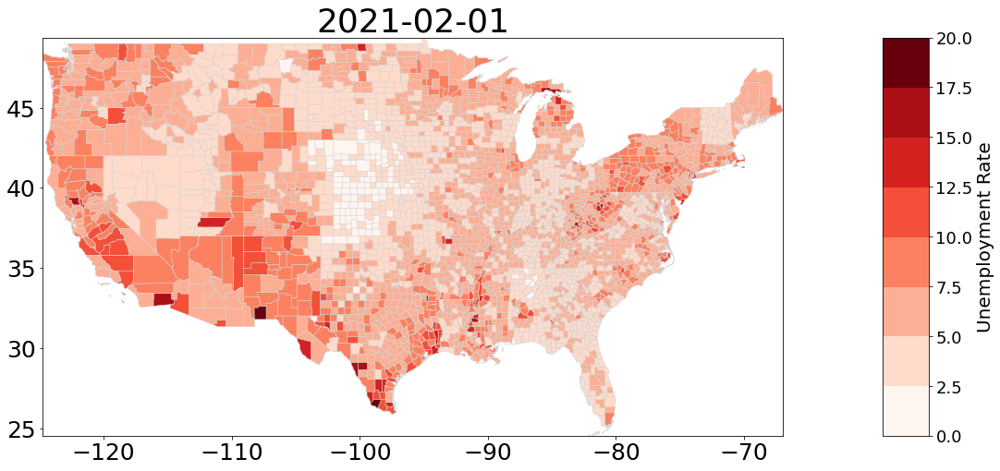

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


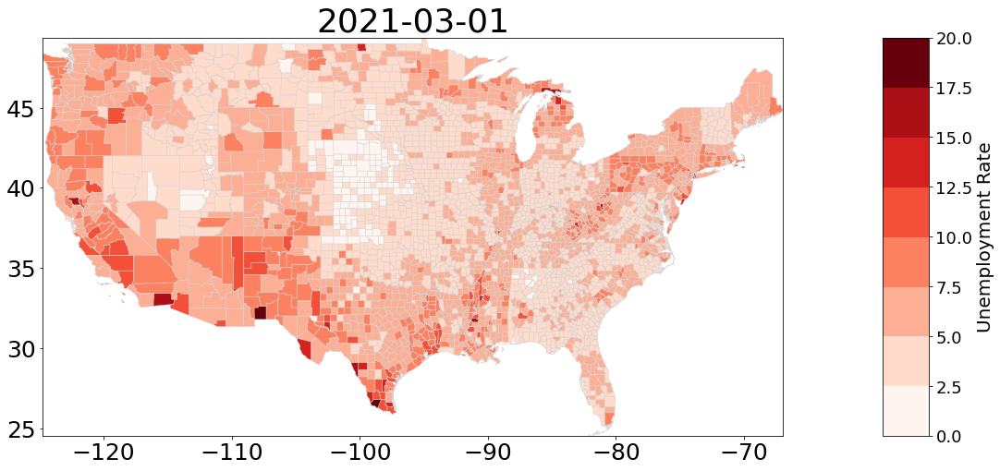

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


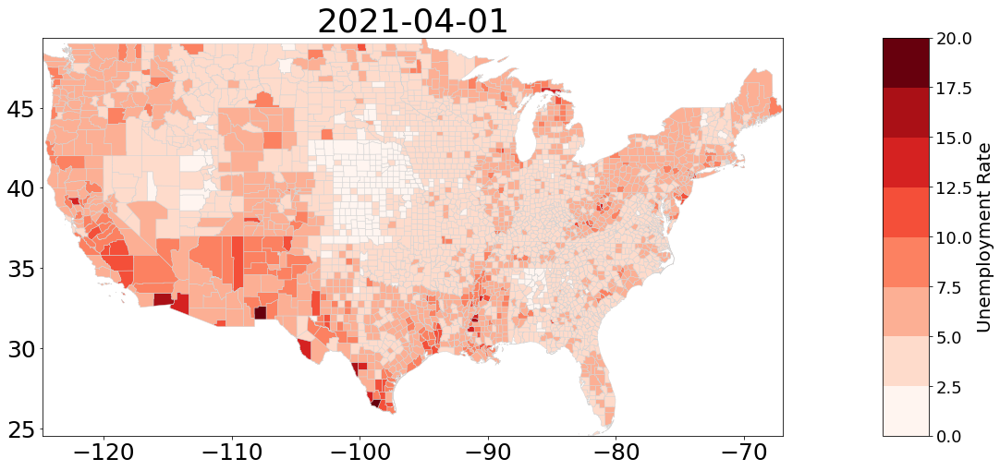

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


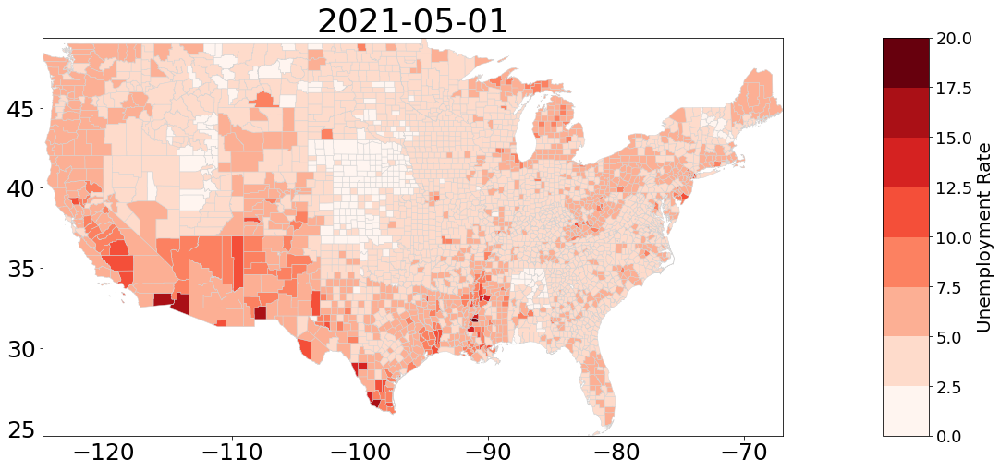

<ipython-input-31-7107afb6e40c>:24: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
<ipython-input-31-7107afb6e40c>:28: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])


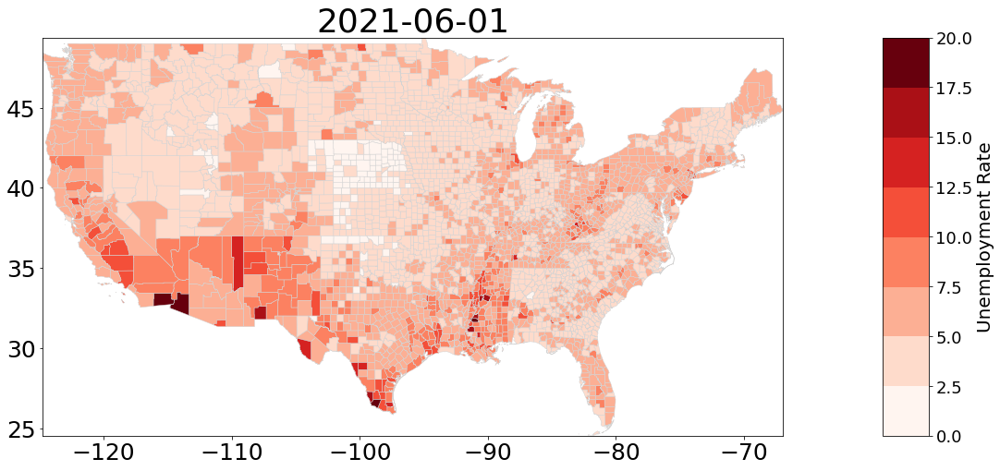

In [31]:
key = "Unemployment Rate"

u_data[key] = u_data[key].astype(float)
for date in dates:
    fig, ax = plt.subplots(figsize = (19,9),
                          subplot_kw = {"aspect": "equal"})
    plt.rcParams.update({"font.size": 30})
    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    
    vmin = 0
    vmax = 20
    cmap = cm.get_cmap("Reds", 8)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)

    sm = cm.ScalarMappable(cmap=cmap, norm=norm)

    sm.A = []

    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)

    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)#[int(x) for x in vals])
    cbar.ax.set_ylabel(key, fontsize=20)

    df = u_data[u_data.index.get_level_values("date") == date]
    df.plot(ax=ax, cax=ax, column = key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(str(date)[:10])
    plt.show()
    plt.close()

In [32]:
import warnings

In [33]:
warnings.filterwarnings("ignore")

key = "Unemployment Rate"
new_key = "Normalized " + key + " (Feb 2020)"
n_u_data = u_data.copy()
n_u_data[new_key] = 0.
n_u_data = n_u_data.reset_index().set_index(["date", "fips_code"])

for date in dates:
    n_u_data[new_key] =n_u_data[key].sub(n_u_data.loc[datetime.datetime(2020,2,1), key])
n_u_data[new_key]

date        fips_code
2019-08-01  1001         0.0
2019-09-01  1001        -0.3
2019-10-01  1001        -0.4
2019-11-01  1001        -0.5
2019-12-01  1001        -0.3
                        ... 
2021-02-01  56045        1.5
2021-03-01  56045        1.0
2021-04-01  56045        0.7
2021-05-01  56045        0.8
2021-06-01  56045        0.6
Name: Normalized Unemployment Rate (Feb 2020), Length: 71484, dtype: float64

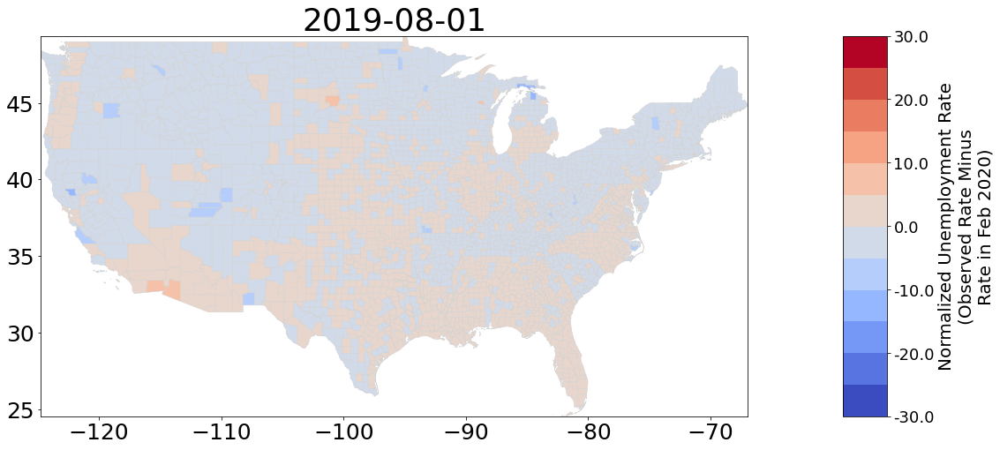

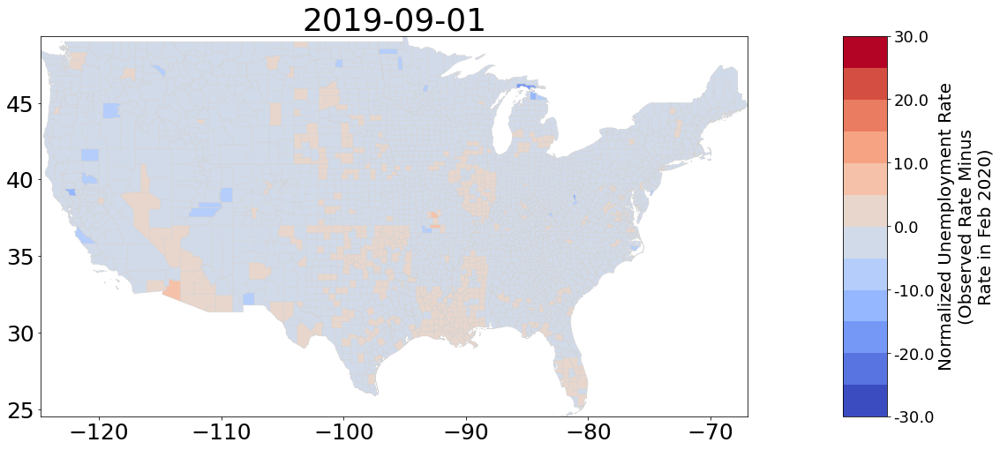

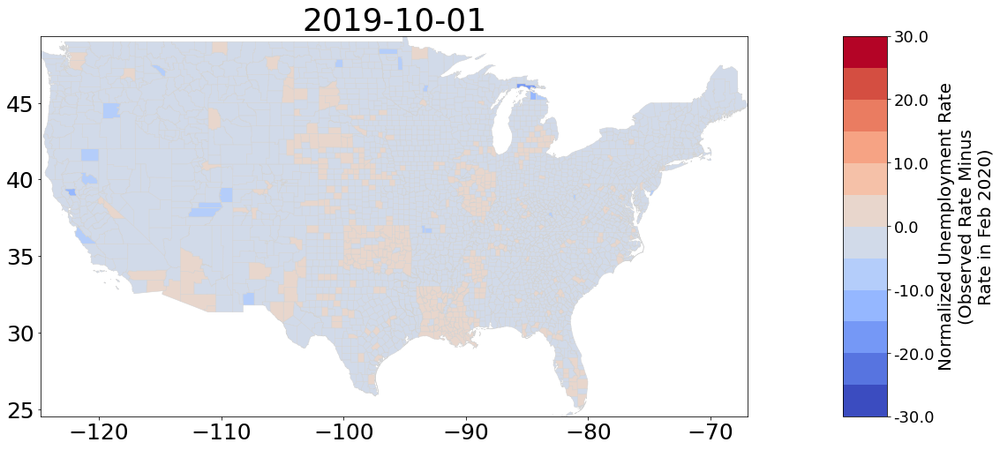

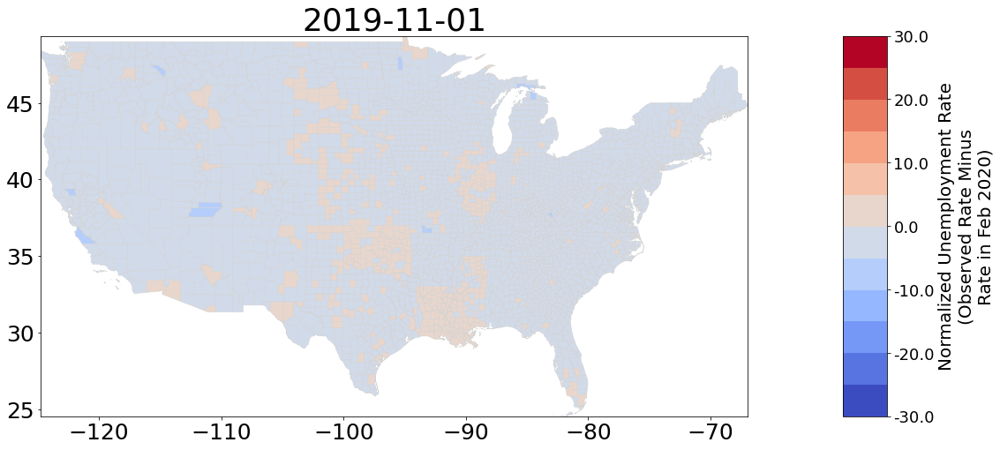

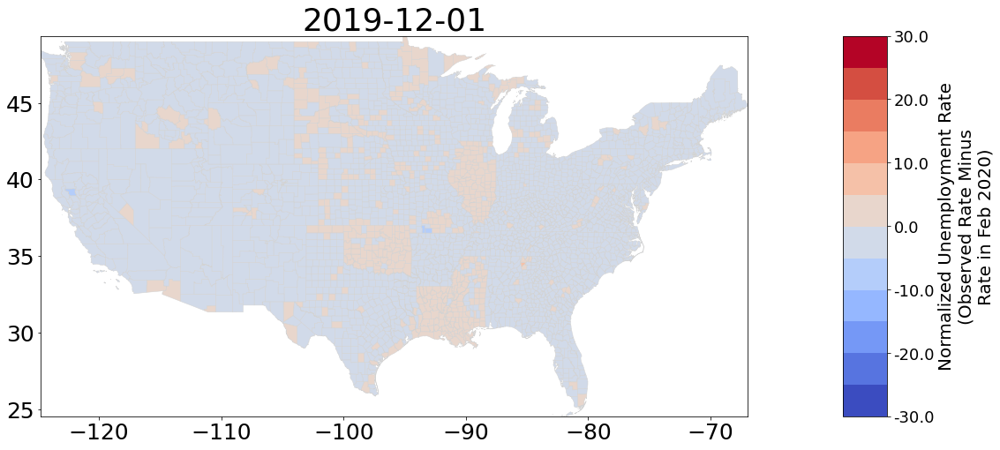

...

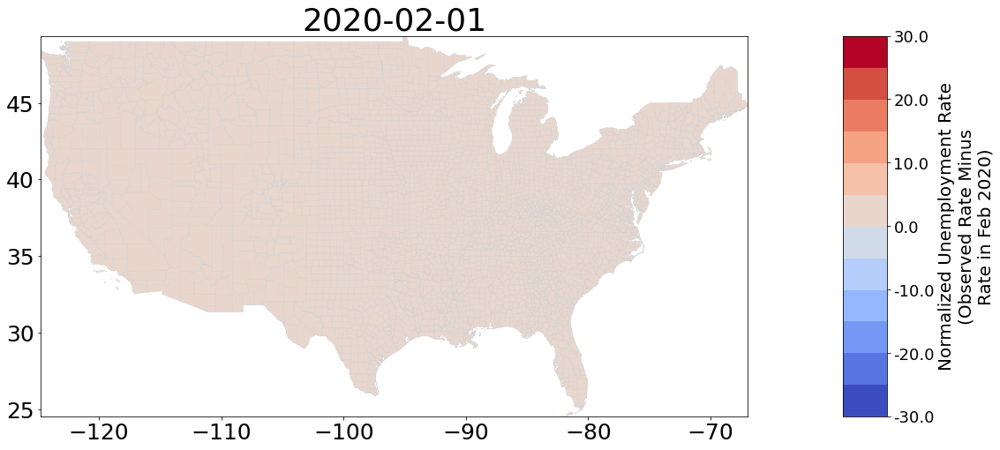

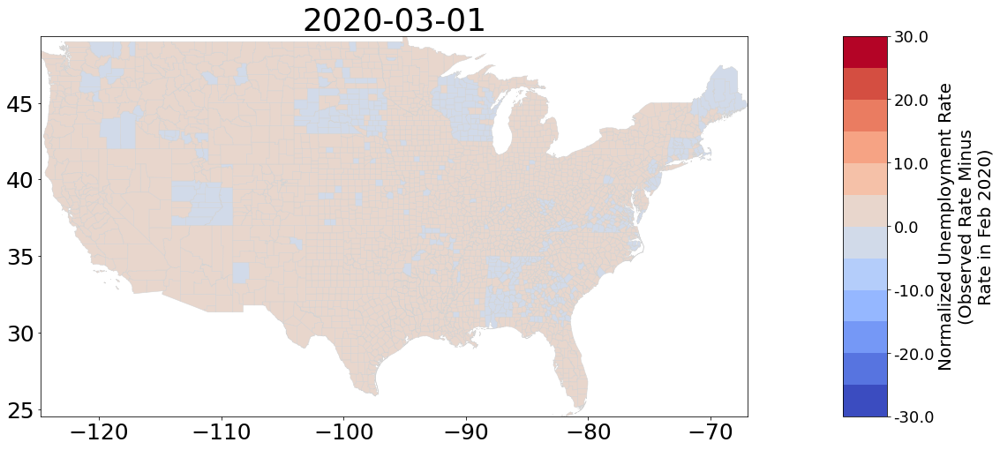

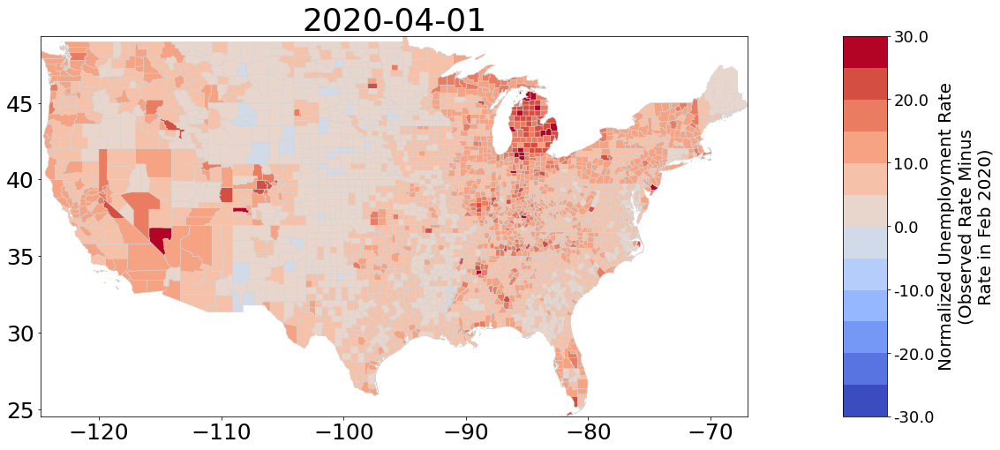

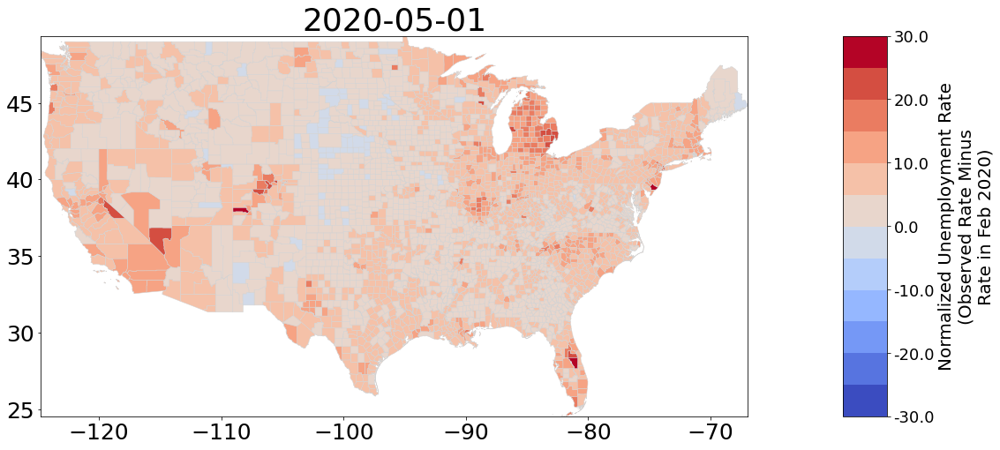

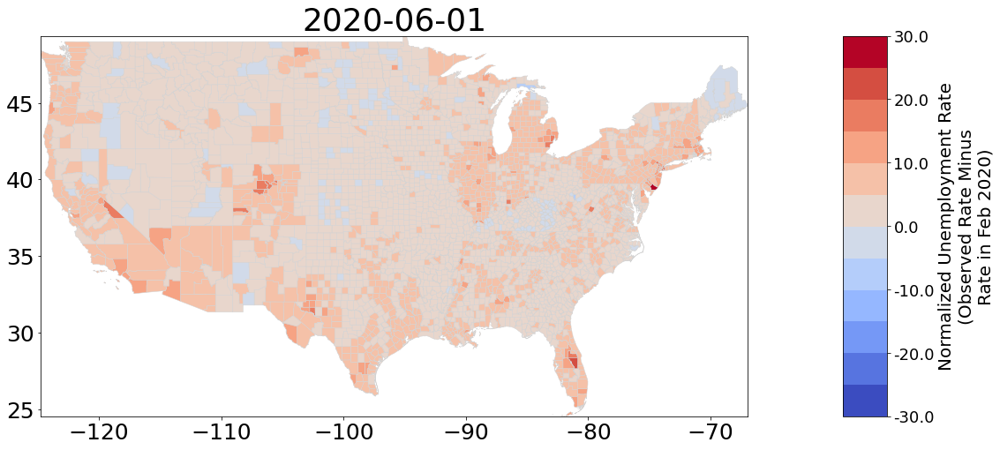

In [ ]:
for date in dates:
    title_date = str(date)[:10]
    fig, ax = plt.subplots(figsize=(19,9),
                          subplot_kw = {"aspect":"equal"})
    plt.rcParams.update({"font.size": 30})

    plt.xticks(fontsize = 25)
    plt.yticks(fontsize = 25)
    
    vmin = -30
    vmax = 30
    cmap = cm.get_cmap("coolwarm", 12)
    norm = cm.colors.Normalize(vmin=vmin, vmax=vmax)

    sm = cm.ScalarMappable(cmap=cmap, norm=norm)
    
    sm.A = []

    divider = make_axes_locatable(ax)
    size = "5%"
    cax = divider.append_axes("right", size = size, pad = .1)

    cbar = fig.colorbar(sm, cax=cax, cmap= cmap)
    cbar.ax.tick_params(labelsize=18)
    vals = list(cbar.ax.get_yticks())
    vals.append(vmax)
    cbar.ax.set_yticklabels(vals)
    cbar.ax.set_ylabel("Normalized "+key + "\n(Observed Rate Minus\nRate in Feb 2020)", fontsize=20)
    
    df = n_u_data.loc[date]
    df.plot(ax=ax, cax=ax, column = new_key,
            vmin=vmin, vmax=vmax,
            cmap=cmap, legend=False, 
            linewidth = .5, edgecolor="lightgrey",norm=norm)
    ax.set_title(title_date)
    plt.show()
    plt.close()